##Importing all the packages

In [ ]:
from IPython.display import Image, display
import numpy as np
from os.path import join
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

In [ ]:
df_org = pd.read_csv('/content/datasets.csv')

df_org.head()

,Dataset,Camera,Category,Author,Organisation/Project,Source,Dataset link,Images,Size in GB (est.),Ground Truth,License,License link,SampleImage,Image Format,DOI,Masks,Description
0,AvignonHotelDesMonnaies,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,11.0,"0,176",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,Hotel des Monnaies facade building in Avignon ...
1,BoutevilleWindowDetail,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,26.0,"0,416",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,Upper window detail of Bouteville Castle (France)
2,BurgosPuertaDeLaCoroneria,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,10.0,"0,16",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,North Transept Portal of Burgos Cathedral
3,CognacGardenBuilding,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,12.0,"0,192",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,Cognac Garden Building image set
4,CognacStJacquesDoor,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,19.0,"0,304",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,Saint Jacques Door at cognac City


In [ ]:
df_org.shape

(356, 17)

In [ ]:
df = df_org.copy()
df = df.dropna(axis=0, subset=['Source'])
df.head()

,Dataset,Camera,Category,Author,Organisation/Project,Source,Dataset link,Images,Size in GB (est.),Ground Truth,License,License link,SampleImage,Image Format,DOI,Masks,Description
0,AvignonHotelDesMonnaies,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,11.0,"0,176",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,Hotel des Monnaies facade building in Avignon ...
1,BoutevilleWindowDetail,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,26.0,"0,416",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,Upper window detail of Bouteville Castle (France)
2,BurgosPuertaDeLaCoroneria,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,10.0,"0,16",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,North Transept Portal of Burgos Cathedral
3,CognacGardenBuilding,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,12.0,"0,192",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,Cognac Garden Building image set
4,CognacStJacquesDoor,Canon EOS 5D Mark II,Building,Romuald Perrot rperrot,NaN,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,19.0,"0,304",no,Attribution-NonCommercial 3.0 Unported,https://github.com/rperrot/ReconstructionDataS...,https://github.com/rperrot/ReconstructionDataS...,JPG,NaN,NaN,Saint Jacques Door at cognac City


In [ ]:
df.shape

(338, 17)

In [ ]:
df.describe()

,Images
count,117.000000
mean,1483.555556
std,12585.427620
min,3.000000
25%,25.000000
50%,120.000000
75%,165.000000
max,135660.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 338 entries, 0 to 339
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Dataset               338 non-null    object 
 1   Camera                120 non-null    object 
 2   Category              160 non-null    object 
 3   Author                233 non-null    object 
 4   Organisation/Project  152 non-null    object 
 5   Source                338 non-null    object 
 6   Dataset link          210 non-null    object 
 7   Images                117 non-null    float64
 8   Size in GB (est.)     111 non-null    object 
 9   Ground Truth          48 non-null     object 
 10  License               196 non-null    object 
 11  License link          133 non-null    object 
 12  SampleImage           23 non-null     object 
 13  Image Format          78 non-null     object 
 14  DOI                   55 non-null     object 
 15  Masks                 8

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

<Figure size 864x576 with 0 Axes>

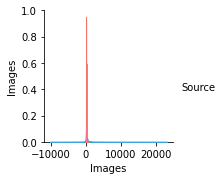

In [ ]:
import seaborn as sns
plt.figure(figsize=(12,8))
sns.pairplot(df, hue = 'Source')

In [ ]:
import requests
from io import BytesIO
from PIL import Image

for i in range(100):
  r = requests.get(df['Source'][i])
  print("Status:", r.status_code)
  print(r.url)

Status: 200
https://github.com/rperrot/ReconstructionDataSet
Status: 200
https://github.com/rperrot/ReconstructionDataSet
Status: 200
https://github.com/rperrot/ReconstructionDataSet
Status: 200
https://github.com/rperrot/ReconstructionDataSet
Status: 200
https://github.com/rperrot/ReconstructionDataSet
Status: 200
https://github.com/rperrot/ReconstructionDataSet
Status: 200
https://github.com/rperrot/ReconstructionDataSet
Status: 200
https://github.com/rperrot/ReconstructionDataSet
Status: 200
https://github.com/rperrot/ReconstructionDataSet
Status: 200
https://github.com/natowi/dataset_flowerpot
Status: 200
https://github.com/alicevision/dataset_monstree
Status: 200
https://github.com/alicevision/dataset_monstree
Status: 200
https://github.com/alicevision/dataset_monstree
Status: 200
https://github.com/alicevision/dataset_buddha
Status: 200
https://github.com/alicevision/dataset_buddha
Status: 200
https://peterfalkingham.com/resources/
Status: 200
https://peterfalkingham.com/resource

In [ ]:
Source_df = df.filter(['Dataset', 'Author', 'Category','Source', 'Dataset link', 'DOI', 'Description'], axis=1)
Source_df.head()

,Dataset,Author,Category,Source,Dataset link,DOI,Description
0,AvignonHotelDesMonnaies,Romuald Perrot rperrot,Building,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,NaN,Hotel des Monnaies facade building in Avignon ...
1,BoutevilleWindowDetail,Romuald Perrot rperrot,Building,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,NaN,Upper window detail of Bouteville Castle (France)
2,BurgosPuertaDeLaCoroneria,Romuald Perrot rperrot,Building,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,NaN,North Transept Portal of Burgos Cathedral
3,CognacGardenBuilding,Romuald Perrot rperrot,Building,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,NaN,Cognac Garden Building image set
4,CognacStJacquesDoor,Romuald Perrot rperrot,Building,https://github.com/rperrot/ReconstructionDataSet,https://github.com/rperrot/ReconstructionDataS...,NaN,Saint Jacques Door at cognac City


##Working on Aerial Dataset

In [ ]:
get_ipython().system_raw("unrar x Village_Dataset.rar")

**List of all images**

In [ ]:
import os
list = os.listdir('/content/Village_Dataset/geotagged-images')
for i in range(len(list)):
  print(list[i])

IMG_7727.JPG
IMG_7752.JPG
IMG_7750.JPG
IMG_7741.JPG
IMG_7721.JPG
IMG_7731.JPG
IMG_7743.JPG
IMG_7732.JPG
IMG_7755.JPG
IMG_7754.JPG
IMG_7737.JPG
IMG_7724.JPG
IMG_7722.JPG
IMG_7738.JPG
IMG_7729.JPG
IMG_7728.JPG
IMG_7746.JPG
IMG_7726.JPG
IMG_7749.JPG
IMG_7745.JPG
IMG_7739.JPG
IMG_7720.JPG
IMG_7733.JPG
IMG_7734.JPG
IMG_7740.JPG
IMG_7719.JPG
IMG_7748.JPG
IMG_7723.JPG
IMG_7725.JPG
IMG_7730.JPG
IMG_7742.JPG
IMG_7744.JPG
IMG_7736.JPG
IMG_7735.JPG
IMG_7747.JPG
IMG_7751.JPG
IMG_7753.JPG


**Displaying all the images available in the aerial dataset**

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


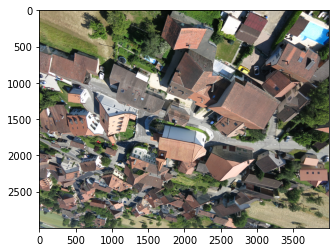

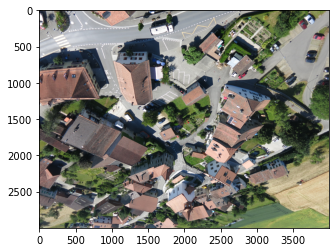

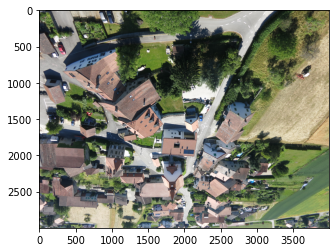

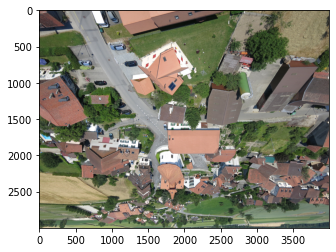

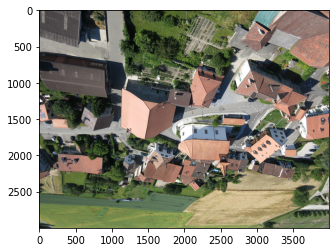

...

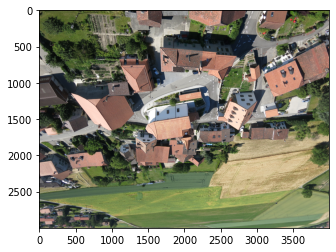

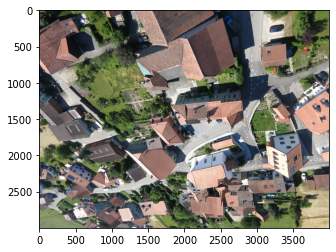

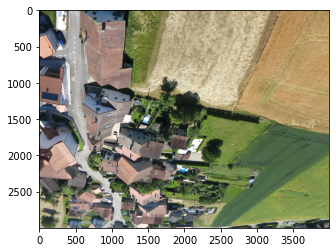

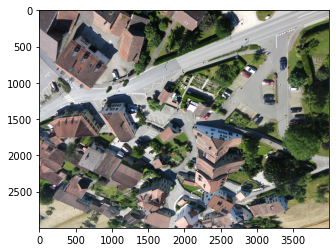

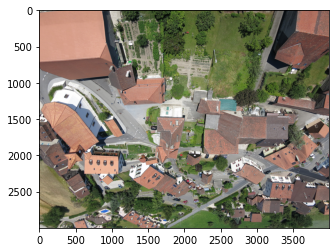

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def process(filename):
    image = mpimg.imread('/content/Village_Dataset/geotagged-images/'+filename)
    plt.figure()
    plt.imshow(image)

for file in list:
    process(file)

##Harris Corner Detection

**Harris Corner Detector in OpenCV**

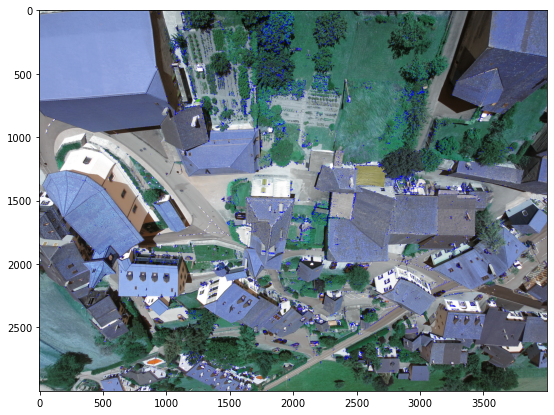

In [ ]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

filename = '/content/Village_Dataset/geotagged-images/IMG_7753.JPG'
img = cv.imread(filename)
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
gray = np.float32(gray)
dst = cv.cornerHarris(gray,2,3,0.04)
#result is dilated for marking the corners, not important
dst = cv.dilate(dst,None)
# Threshold for an optimal value, it may vary depending on the image.
img[dst>0.01*dst.max()]=[0,0,255]
plt.imshow(img)
if cv.waitKey(0) & 0xff == 27:
    cv.destroyAllWindows()

**Corner with SubPixel Accuracy**

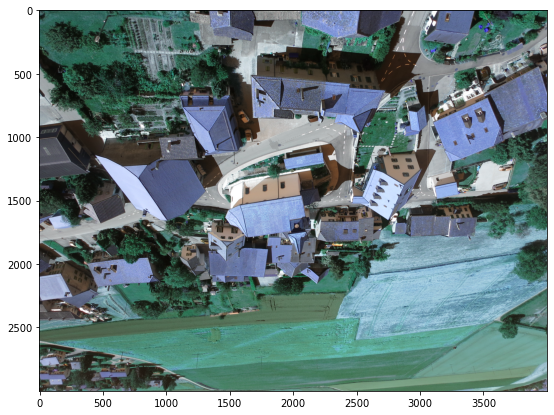

In [ ]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

filename = '/content/Village_Dataset/geotagged-images/IMG_7736.JPG'
img = cv.imread(filename)
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
# find Harris corners
gray = np.float32(gray)
dst = cv.cornerHarris(gray,2,3,0.04)
dst = cv.dilate(dst,None)
ret, dst = cv.threshold(dst,0.01*dst.max(),255,0)
dst = np.uint8(dst)
# find centroids
ret, labels, stats, centroids = cv.connectedComponentsWithStats(dst)
# define the criteria to stop and refine the corners
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 100, 0.001)
corners = cv.cornerSubPix(gray,np.float32(centroids),(5,5),(-1,-1),criteria)
# Now draw them
res = np.hstack((centroids,corners))
res = np.int0(res)
img[res[:,1],res[:,0]]=[0,0,255]
img[res[:,3],res[:,2]] = [0,255,0]
cv.imwrite('subpixel5.png',img)
plt.imshow(img)

##Shi-Tomasi Corner Detector

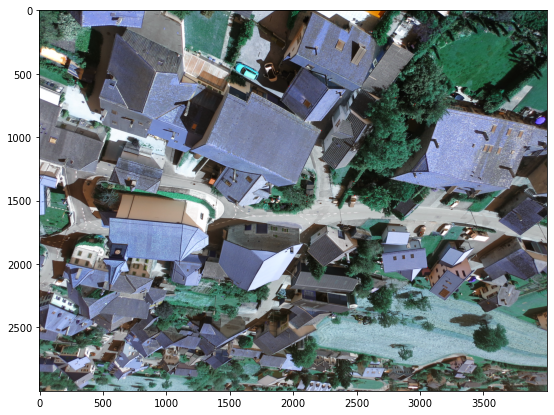

(<matplotlib.image.AxesImage at 0x7fcbe72b2240>, None)

In [ ]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt

img = cv.imread('/content/Village_Dataset/geotagged-images/IMG_7725.JPG')
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
corners = cv.goodFeaturesToTrack(gray,25,0.01,10)
corners = np.int0(corners)
for i in corners:
    x,y = i.ravel()
    cv.circle(img,(x,y),3,255,-1)
plt.imshow(img),plt.show()

##Scale-Invariant Feature Transform (SIFT) 

In [ ]:
!pip uninstall opencv-python==4.1.2 -y
!pip uninstall opencv-contrib-python==4.1.2 -y

Uninstalling opencv-python-4.1.2.30:
  Successfully uninstalled opencv-python-4.1.2.30
Uninstalling opencv-contrib-python-4.1.2.30:
  Successfully uninstalled opencv-contrib-python-4.1.2.30


In [ ]:
!pip install opencv-python 
!pip install opencv-contrib-python 
# !pip install opencv-python==3.3.0.10 &> /dev/null
# !pip opencv-contrib-python==3.3.0.10 &> /dev/null

     |████████████████████████████████| 49.5MB 83kB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
     |████████████████████████████████| 55.7MB 89kB/s 


In [ ]:
cv2.__version__

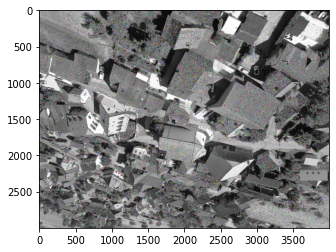

In [ ]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

img = cv.imread('/content/Village_Dataset/geotagged-images/IMG_7727.JPG')
gray= cv.cvtColor(img,cv.COLOR_BGR2GRAY)
sift = cv.SIFT_create()
kp = sift.detect(gray,None)
img=cv.drawKeypoints(gray,kp,img)
# cv.imwrite('sift_keypoints.jpg',img)
plt.imshow(img)

##Speeded-Up Robust Features (SURF) 

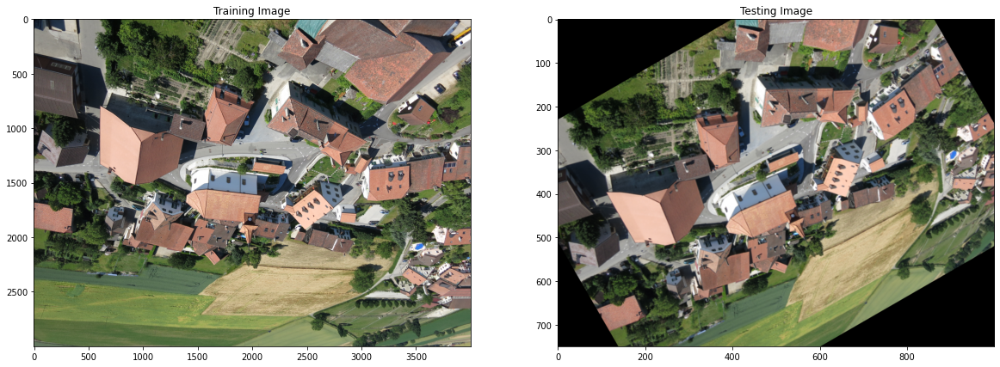

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# Load the image
image1 = cv2.imread('/content/Village_Dataset/geotagged-images/IMG_7737.JPG')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_RGB2GRAY)

# Create test image by adding Scale Invariance and Rotational Invariance
test_image = cv2.pyrDown(training_image)
test_image = cv2.pyrDown(test_image)
num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

# Display traning image and testing image
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Training Image")
plots[0].imshow(training_image)

plots[1].set_title("Testing Image")
plots[1].imshow(test_image)

In [ ]:
surf = cv2.xfeatures2d.SURF_create(800)

train_keypoints, train_descriptor = surf.detectAndCompute(training_gray, None)
test_keypoints, test_descriptor = surf.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(training_image)
keypoints_with_size = np.copy(training_image)

cv2.drawKeypoints(training_image, train_keypoints, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(training_image, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))

In [ ]:
# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck = False)

# Perform the matching between the SURF descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(training_image, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

##Features from Accelerated Segment Test (FAST)

Threshold: 10
nonmaxSuppression:True
neighborhood: 2
Total Keypoints with nonmaxSuppression: 243648
Total Keypoints without nonmaxSuppression: 1120817


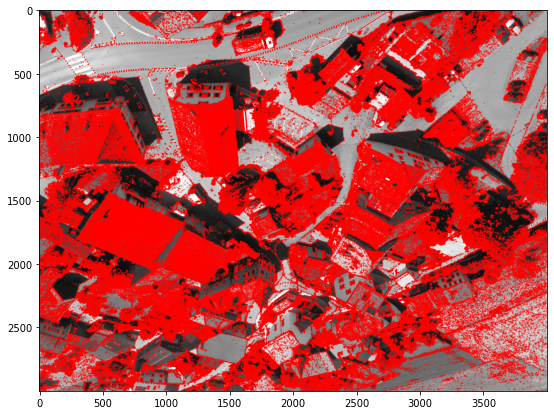

In [ ]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
img = cv.imread('/content/Village_Dataset/geotagged-images/IMG_7752.JPG',0)
# Initiate FAST object with default values
fast = cv.FastFeatureDetector_create()
# find and draw the keypoints
kp = fast.detect(img,None)
img2 = cv.drawKeypoints(img, kp, None, color=(255,0,0))
# Print all default params
print( "Threshold: {}".format(fast.getThreshold()) )
print( "nonmaxSuppression:{}".format(fast.getNonmaxSuppression()) )
print( "neighborhood: {}".format(fast.getType()) )
print( "Total Keypoints with nonmaxSuppression: {}".format(len(kp)) )
# cv.imwrite('fast_true.png',img2)
plt.imshow(img2)
# Disable nonmaxSuppression
fast.setNonmaxSuppression(0)
kp = fast.detect(img,None)
print( "Total Keypoints without nonmaxSuppression: {}".format(len(kp)) )
img3 = cv.drawKeypoints(img, kp, None, color=(255,0,0))
# cv.imwrite('fast_false.png',img3)
plt.imshow(img3)
plt.show()

##Binary Robust Independent Elementary Features (BRIEF)

In [ ]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
img = cv.imread('/content/Village_Dataset/geotagged-images/IMG_7752.JPG',0)
# Initiate FAST detector
star = cv.xfeatures2d.StarDetector_create()
# Initiate BRIEF extractor
brief = cv.xfeatures2d.BriefDescriptorExtractor_create()
# find the keypoints with STAR
kp = star.detect(img,None)
# compute the descriptors with BRIEF
kp, des = brief.compute(img, kp)
print( brief.descriptorSize() )
print( des.shape )

32
(13755, 32)


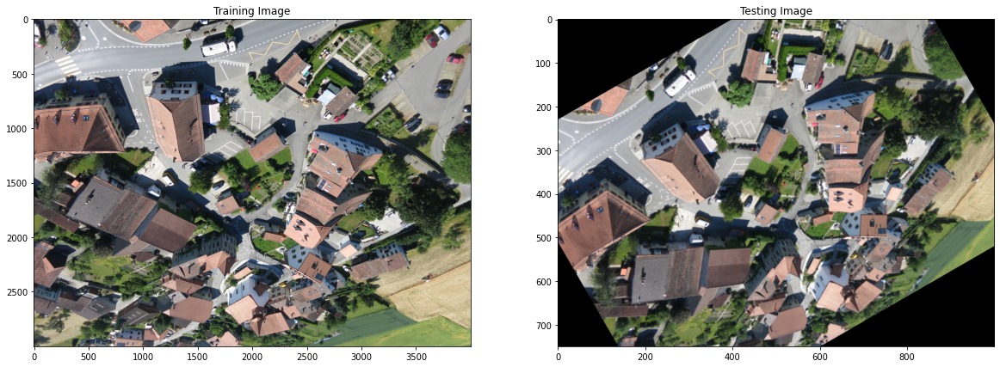

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# Load the image
image1 = cv2.imread('/content/Village_Dataset/geotagged-images/IMG_7752.JPG')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_RGB2GRAY)

# Create test image by adding Scale Invariance and Rotational Invariance
test_image = cv2.pyrDown(training_image)
test_image = cv2.pyrDown(test_image)
num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

# Display traning image and testing image
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Training Image")
plots[0].imshow(training_image)

plots[1].set_title("Testing Image")
plots[1].imshow(test_image)

Number of Keypoints Detected In The Training Image:  239226
Number of Keypoints Detected In The Query Image:  12480


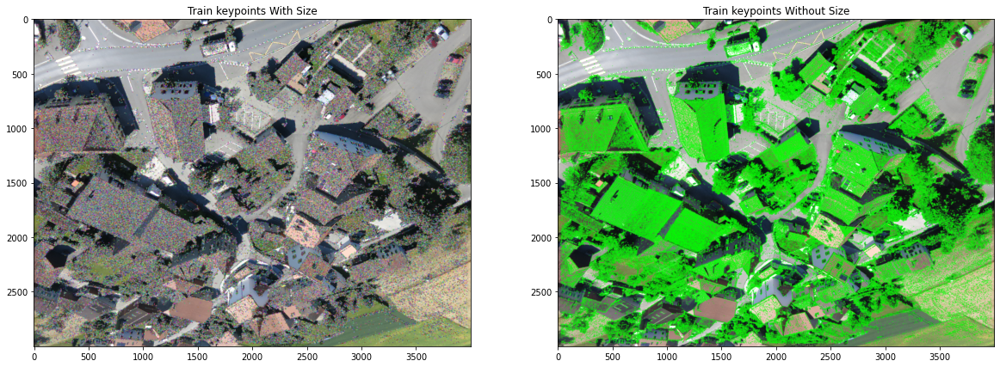

In [ ]:
fast = cv2.FastFeatureDetector_create() 
brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()

train_keypoints = fast.detect(training_gray, None)
test_keypoints = fast.detect(test_gray, None)

train_keypoints, train_descriptor = brief.compute(training_gray, train_keypoints)
test_keypoints, test_descriptor = brief.compute(test_gray, test_keypoints)

keypoints_without_size = np.copy(training_image)
keypoints_with_size = np.copy(training_image)

cv2.drawKeypoints(training_image, train_keypoints, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(training_image, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))

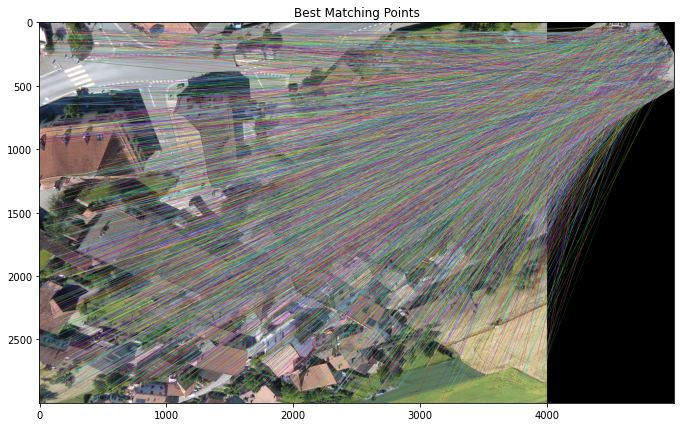


Number of Matching Keypoints Between The Training and Query Images:  6031


In [ ]:
# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the BRIEF descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(training_image, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

##Oriented FAST and Rotated BRIEF (ORB)

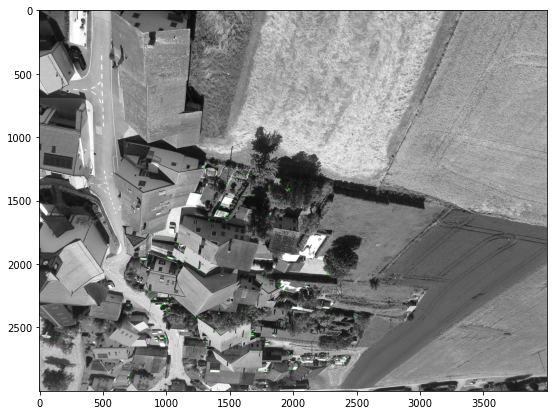

(<matplotlib.image.AxesImage at 0x7fcbda787748>, None)

In [ ]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
img = cv.imread('/content/Village_Dataset/geotagged-images/IMG_7747.JPG',0)
# Initiate ORB detector
orb = cv.ORB_create()
# find the keypoints with ORB
kp = orb.detect(img,None)
# compute the descriptors with ORB
kp, des = orb.compute(img, kp)
# draw only keypoints location,not size and orientation
img2 = cv.drawKeypoints(img, kp, None, color=(0,255,0), flags=0)
plt.imshow(img2), plt.show()